In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/pose-estimation/annotations.xml
/kaggle/input/pose-estimation/PoseEstimation/fiile_info.csv
/kaggle/input/pose-estimation/PoseEstimation/PE/20.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/6.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/5.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/8.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/10.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/0.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/9.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/1.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/16.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/23.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/7.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/28.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/22.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/24.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/13.jpg
/kaggle/input/pose-estimation/PoseEstimation/PE/17.jpg
/kaggle/input/pose-es

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 13.9 MB/s eta 0:00:00


In [3]:
import cv2
import tensorflow as tf
from ultralytics import YOLO
import matplotlib.pyplot as plt

class Trio:
    def __init__(self, model_name,conf):
        'A model trained on hands and face dataset 0:face 1:hand'
        self.model = YOLO(model_name)
        self.face = 0
        self.hands = 1

    def get_trio(self, image_path):
        image = cv2.imread(image_path)
        result = self.model(image,conf=0.25)
        bounding_boxes = result[0].boxes.xyxy
        classes = result[0].boxes.cls
        orig_im = result[0].orig_img
        hands = []

        for i, j in zip(classes, bounding_boxes):
            if i == self.face:
                x, y, w, h = j
                hands.append(cv2.resize(orig_im[int(y):int(h), int(x):int(w)], (200, 200)))
            if i == self.hands:
                x, y, w, h = j
                hands.append(cv2.resize(orig_im[int(y):int(h), int(x):int(w)], (200, 200)))

        # Convert hands to a 4D TensorFlow tensor
        hands_as_tensors = [tf.convert_to_tensor(hand) for hand in hands]
        hands_tensor = tf.stack(hands_as_tensors, axis=0)

        return hands_tensor



    def plot(self, image_path):
        images = self.get_trio(image_path)
        num_images = len(images)

        if num_images == 0:
            print("No images to plot.")
            return

        # Create subplots to display the images
        fig, axes = plt.subplots(1, num_images, figsize=(num_images * 5, 5))

        for i, img in enumerate(images):
            
            axes[i].imshow(img) 
            axes[i].set_title(f"Image {i+1}")
            axes[i].axis("off")

        plt.show()



/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.



0: 448x640 1 face, 1 hand, 48.8ms
Speed: 14.5ms preprocess, 48.8ms inference, 221.3ms postprocess per image at shape (1, 3, 448, 640)


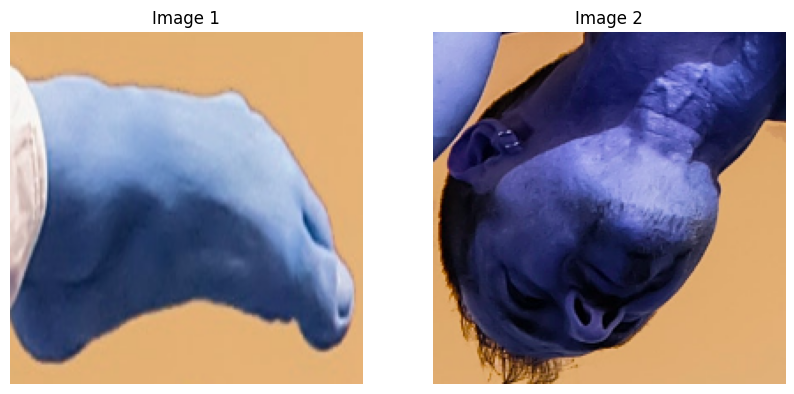


0: 640x448 1 face, 2 hands, 46.9ms
Speed: 3.5ms preprocess, 46.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 448)


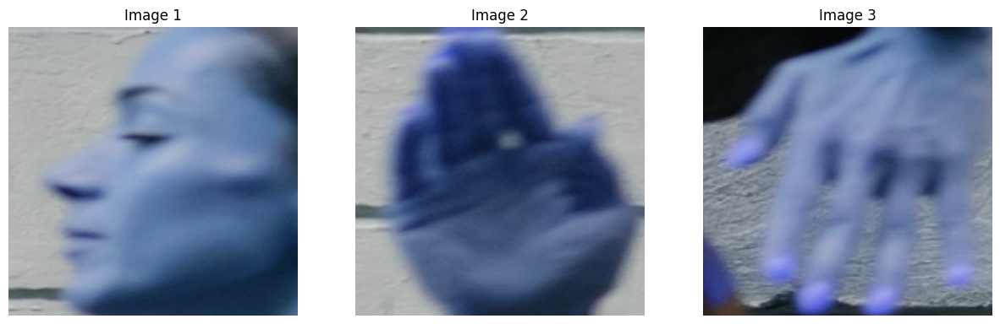


0: 640x480 1 face, 2 hands, 47.5ms
Speed: 3.5ms preprocess, 47.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


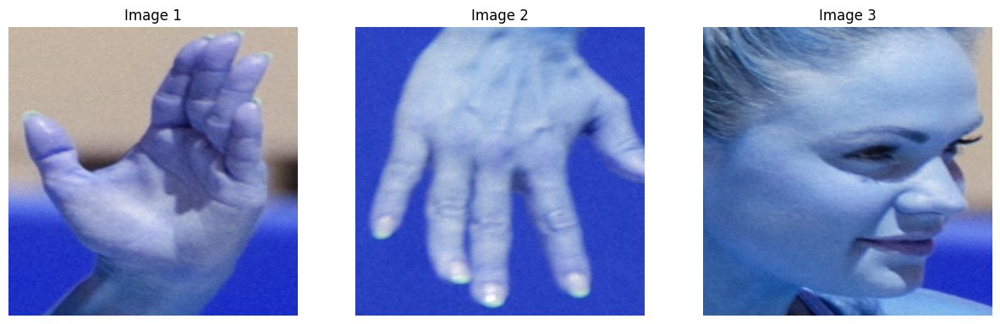


0: 640x544 1 face, 2 hands, 47.3ms
Speed: 3.8ms preprocess, 47.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 544)


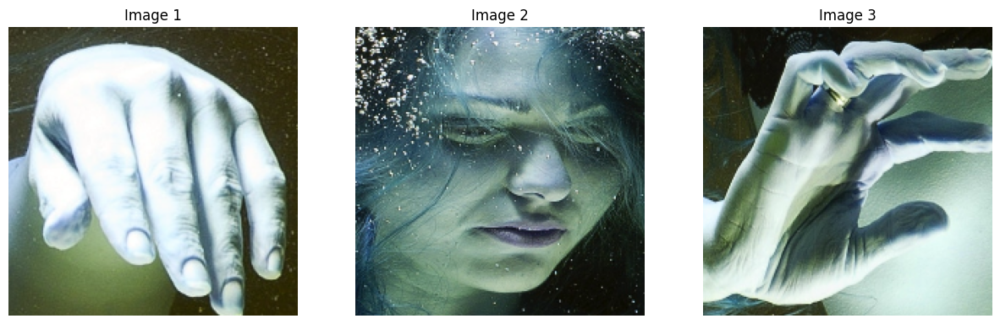


0: 640x512 1 face, 1 hand, 47.0ms
Speed: 3.4ms preprocess, 47.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 512)


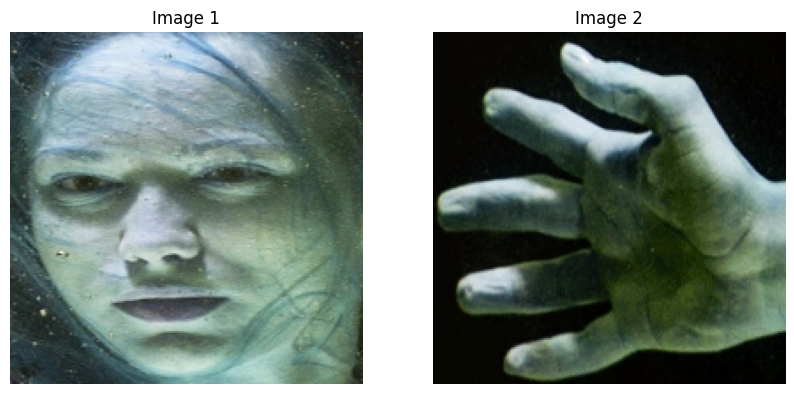


0: 640x448 1 face, 2 hands, 6.5ms
Speed: 3.1ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)


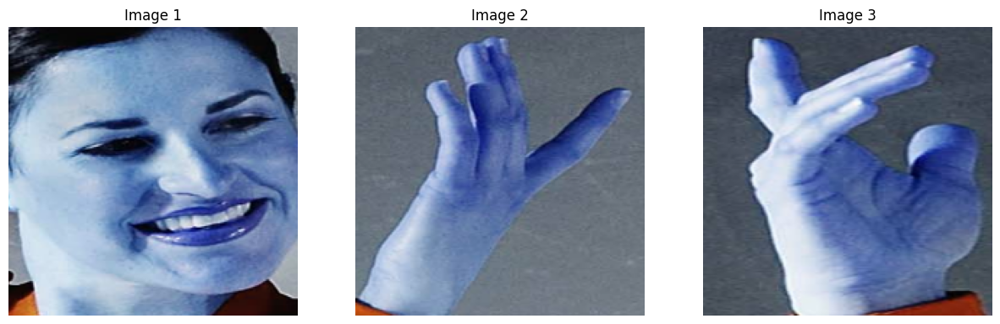


0: 640x544 1 hand, 7.4ms
Speed: 4.4ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 544)
Eroor occured while processing file:9.jpg

0: 640x448 1 face, 2 hands, 6.4ms
Speed: 2.9ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 448)


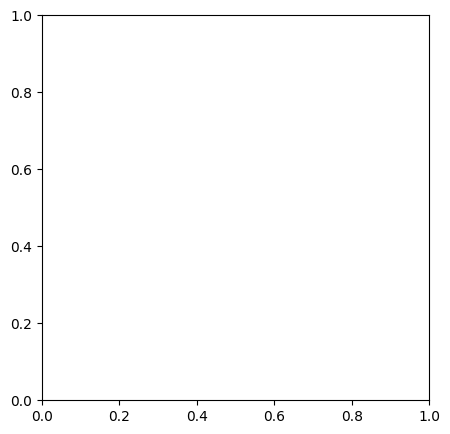

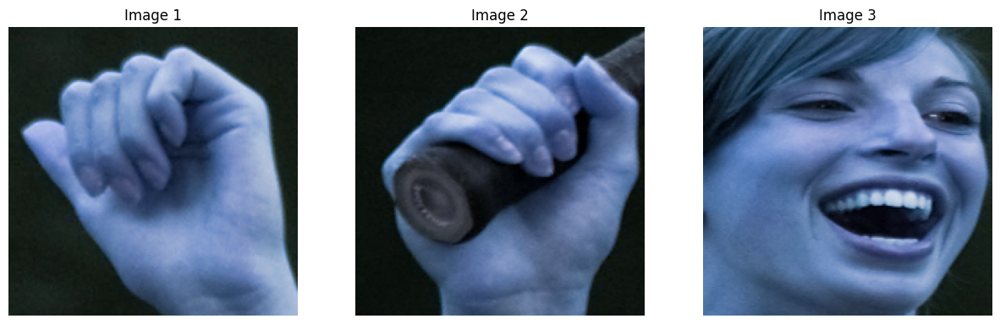


0: 640x480 1 face, 2 hands, 6.6ms
Speed: 3.4ms preprocess, 6.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)


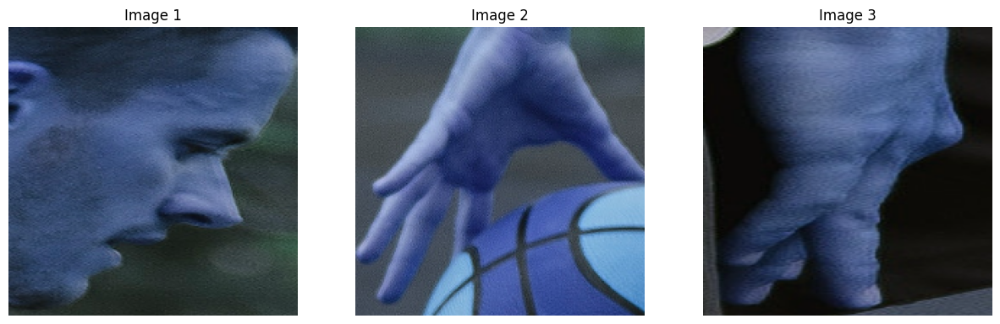


0: 640x448 1 hand, 7.1ms
Speed: 3.2ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 448)
Eroor occured while processing file:23.jpg

0: 640x416 2 hands, 46.8ms
Speed: 3.1ms preprocess, 46.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 416)


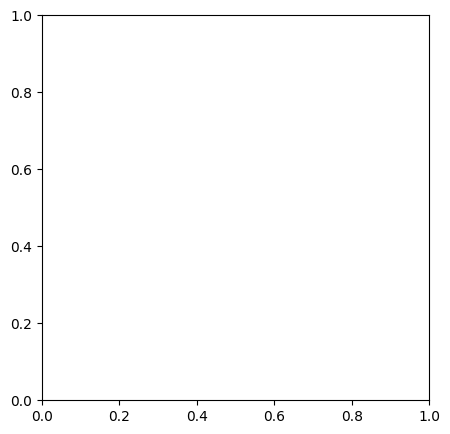

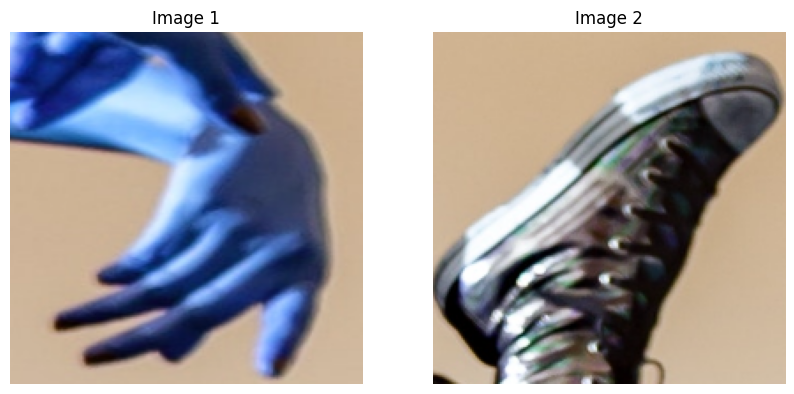


0: 448x640 1 face, 6.5ms
Speed: 2.6ms preprocess, 6.5ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)
Eroor occured while processing file:28.jpg

0: 640x448 1 face, 2 hands, 6.4ms
Speed: 3.8ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)


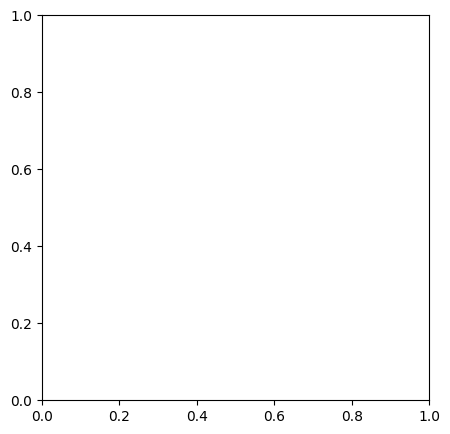

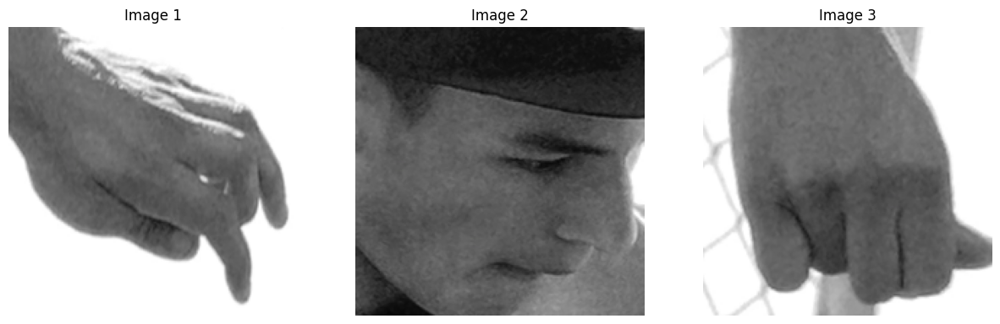


0: 640x448 1 face, 2 hands, 5.9ms
Speed: 3.3ms preprocess, 5.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 448)


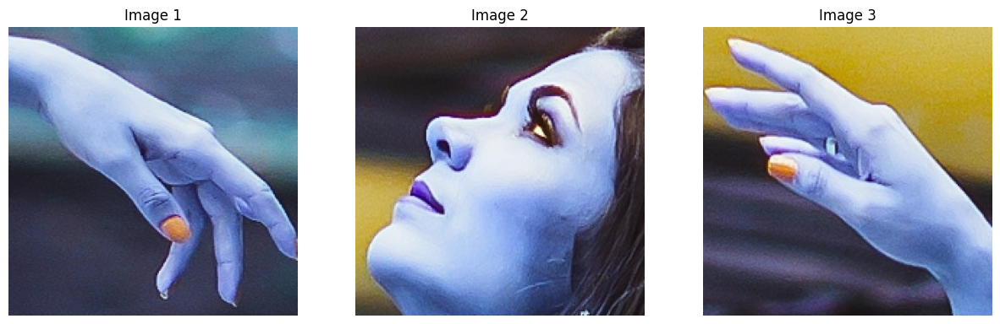


0: 640x448 (no detections), 5.9ms
Speed: 3.4ms preprocess, 5.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)
No images to plot.

0: 640x448 1 face, 2 hands, 5.8ms
Speed: 3.5ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 448)


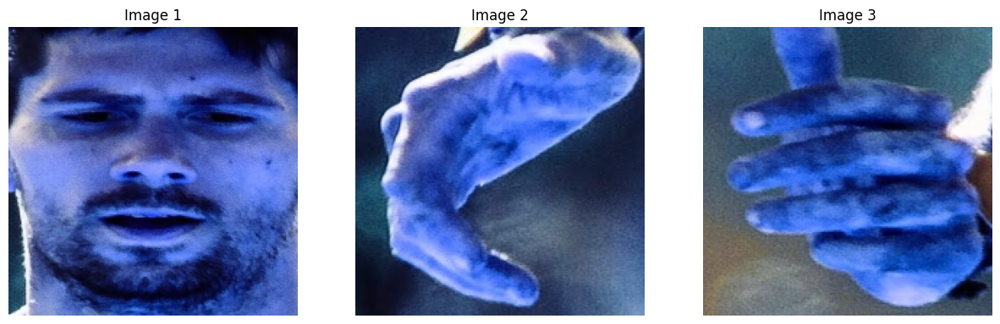


0: 640x448 1 face, 2 hands, 6.1ms
Speed: 3.4ms preprocess, 6.1ms inference, 7.7ms postprocess per image at shape (1, 3, 640, 448)


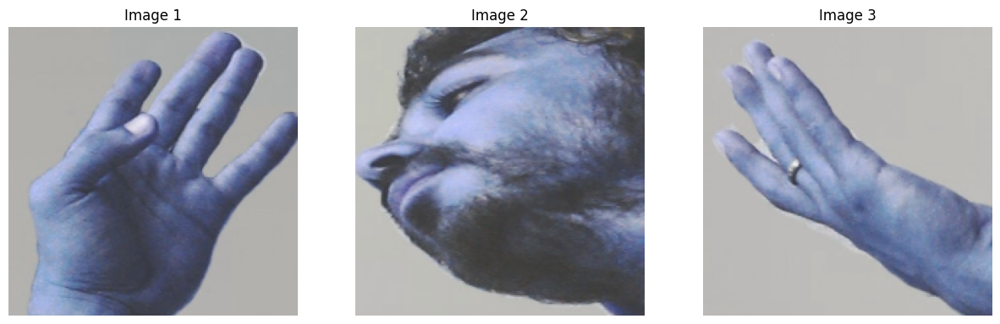


0: 640x448 2 hands, 6.0ms
Speed: 3.0ms preprocess, 6.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 448)


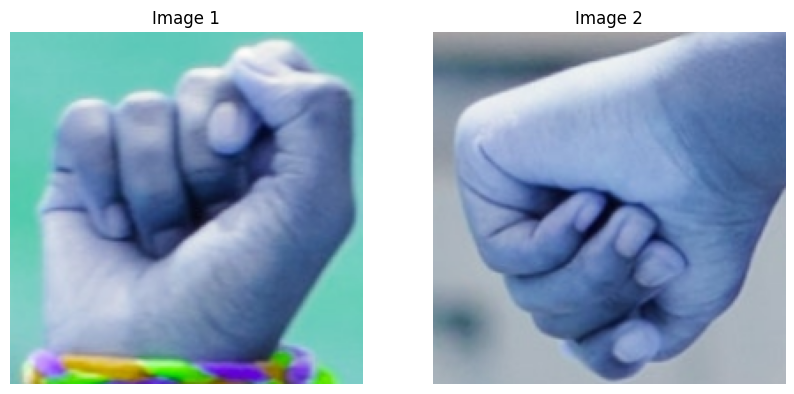


0: 448x640 1 hand, 6.8ms
Speed: 3.2ms preprocess, 6.8ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)
Eroor occured while processing file:12.jpg

0: 640x448 1 face, 2 hands, 6.5ms
Speed: 3.5ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 448)


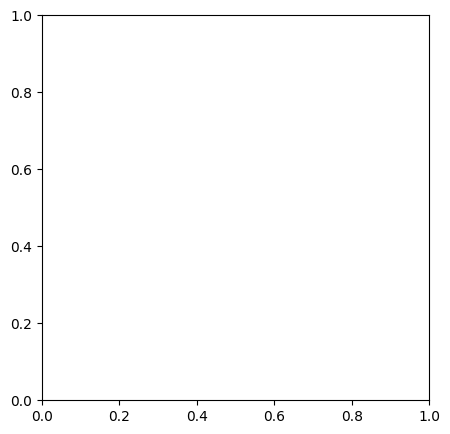

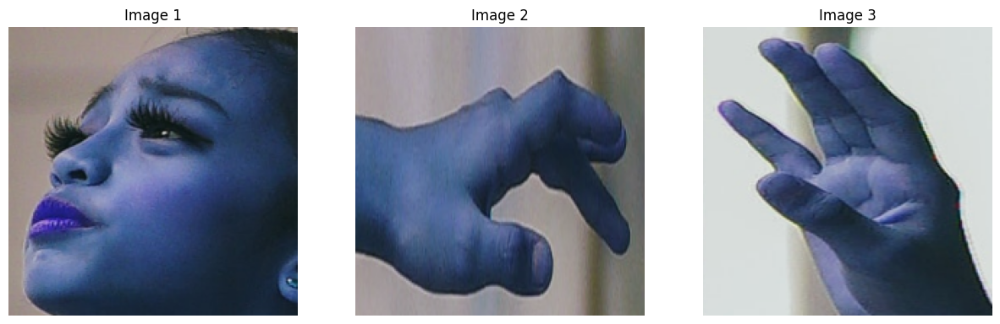


0: 448x640 3 faces, 2 hands, 6.4ms
Speed: 3.4ms preprocess, 6.4ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


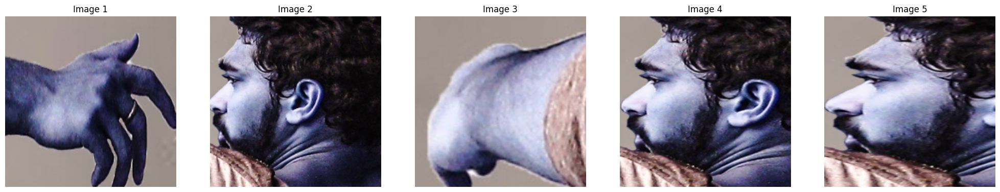


0: 448x640 1 face, 2 hands, 6.3ms
Speed: 4.3ms preprocess, 6.3ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


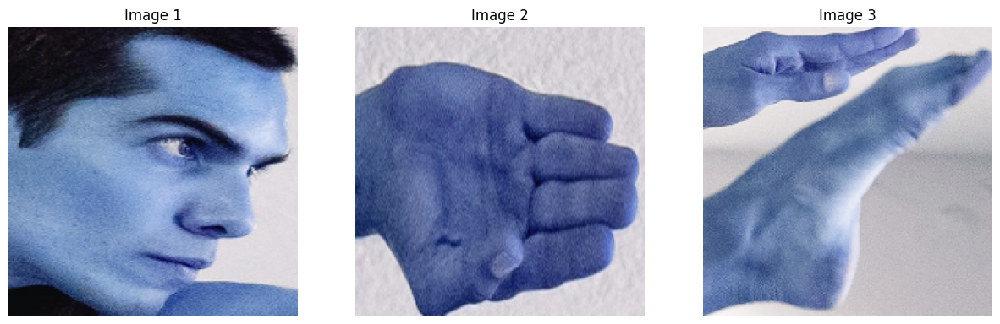


0: 640x448 3 faces, 2 hands, 6.5ms
Speed: 3.1ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 448)


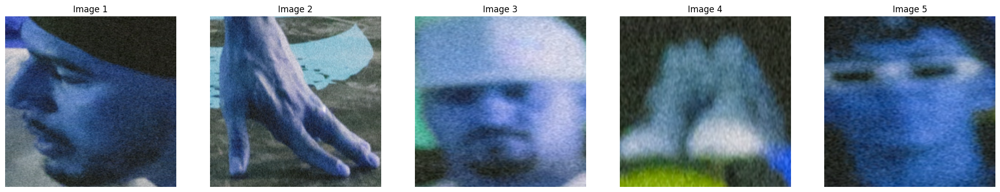


0: 640x448 1 face, 3 hands, 6.0ms
Speed: 3.2ms preprocess, 6.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 448)


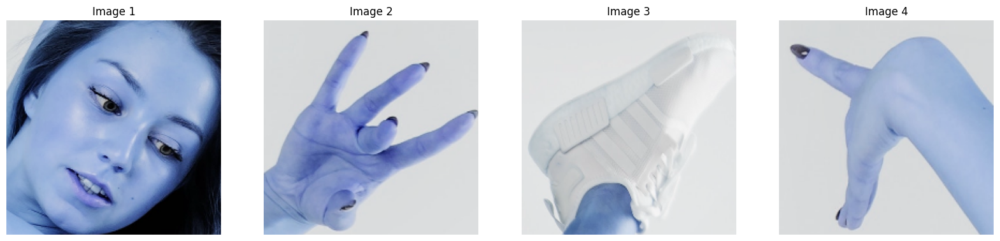


0: 640x448 1 face, 1 hand, 6.2ms
Speed: 3.6ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 448)


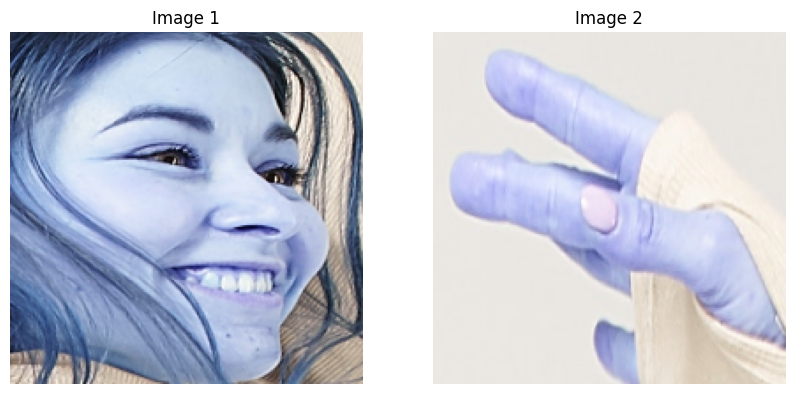


0: 448x640 1 face, 6.3ms
Speed: 3.2ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)
Eroor occured while processing file:14.jpg

0: 640x448 1 face, 1 hand, 6.8ms
Speed: 3.2ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 448)


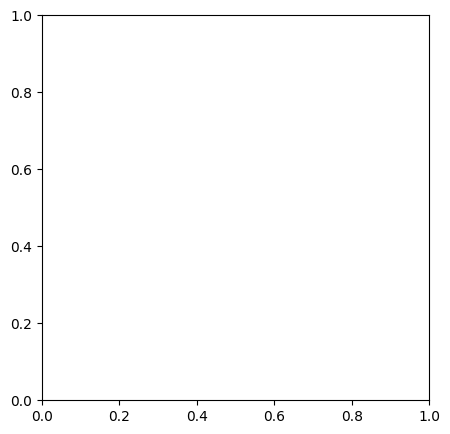

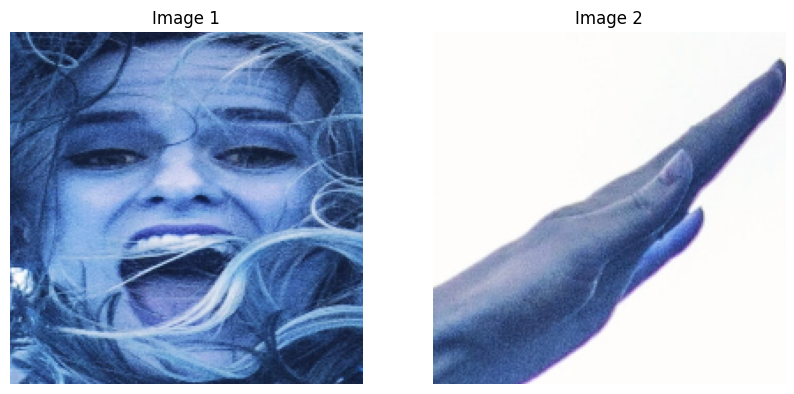


0: 640x448 1 face, 2 hands, 6.0ms
Speed: 3.2ms preprocess, 6.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 448)


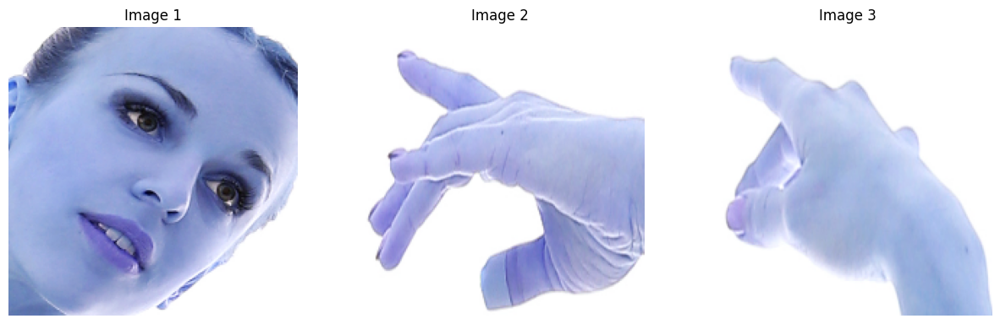


0: 640x576 2 hands, 47.1ms
Speed: 3.8ms preprocess, 47.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 576)


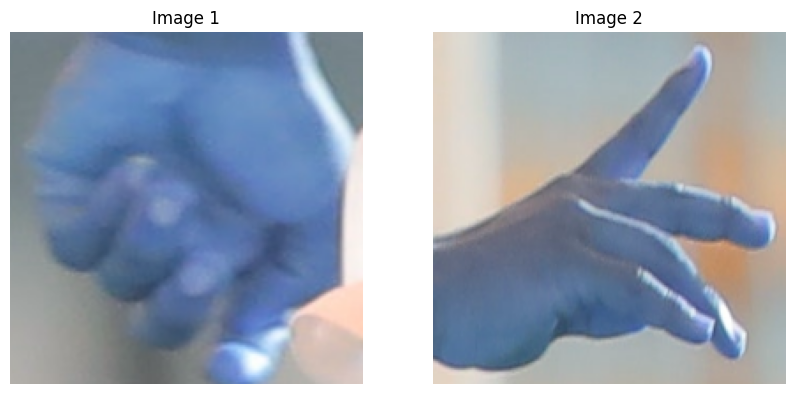

In [4]:
import os
MODEL=Trio('/kaggle/input/small-detection-model/best (1)kkk.pt',0.5)
path_to_images='/kaggle/input/pose-estimation/PoseEstimation/PE'
images_to_test=os.listdir(path_to_images)
for i in images_to_test:
    try:
        MODEL.plot(os.path.join(path_to_images,i))
    except:
        print(f"Eroor occured while processing file:{i}")
        continue

In [5]:
!pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.1/36.1 MB 39.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 28.9 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf 23.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
cuml 23.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
dask-cudf 23.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
apache-beam 2.46.0 requires dill<0.3.2,>=0.3.1.1, but you have dill 0.3.7 which is incompatible.
apache-beam 2.46.0 requires protobuf<4,>3.12.2, but you have protobuf 4.25.5 which is incompatible.
apache-beam 2.46.0 requires pyarrow<10.0.0,>=3.0.0, but you have pyarrow 11.0.0 which is incompat